## YOLO11 Image Classification on Custom Dataset

In [19]:
import os
os.environ['NO_ALBUMENTATIONS_UPDATE'] = '1'
from IPython.display import Image

In [20]:
!nvidia-smi

Sun Jan 12 14:40:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P0             34W /  250W |     537MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


In [38]:
#!pip install --upgrade ultralytics

In [39]:
#!pip install -U albumentations

In [37]:
#!pip install ultralytics

In [24]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mKLo8Jlj6hy8KqEpN3qg")
project = rf.workspace("poultrydiseasedetection").project("fowl-pox")
version = project.version(1)
dataset = version.download("folder")

loading Roboflow workspace...
loading Roboflow project...


In [26]:
from ultralytics import YOLO

#loading classification model
model = YOLO('yolo11n-cls.pt')

#train the model
results = model.train(data='/kaggle/working/Fowl-pox-1', epochs=5, imgsz=640)

Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=classify, mode=train, model=yolo11n-cls.pt, data=/kaggle/working/Fowl-pox-1, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning /kaggle/working/Fowl-pox-1/train... 810 images, 0 corrupt: 100%|██████████| 810/810 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Fowl-pox-1/test... 39 images, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/classify/train3
Starting training for 5 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 23.37it/s]

                   all          1          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 22.99it/s]

                   all          1          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 21.80it/s]

                   all          1          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s]

                   all          1          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 25.55it/s]

                   all          1          1



5 epochs completed in 0.032 hours.
Optimizer stripped from runs/classify/train3/weights/last.pt, 3.2MB
Optimizer stripped from runs/classify/train3/weights/best.pt, 3.2MB

Validating runs/classify/train3/weights/best.pt...
Ultralytics 8.3.59 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n-cls summary (fused): 112 layers, 1,527,305 parameters, 0 gradients, 3.2 GFLOPs
WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.
train: /kaggle/working/Fowl-pox-1/train... found 810 images in 1 classes ✅ 
val: None...
test: /kaggle/working/Fowl-pox-1/test... found 39 images in 1 classes ✅ 


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 21.68it/s]


                   all          1          1
Speed: 0.5ms preprocess, 1.4ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train3


# Inference

In [28]:
from IPython.display import Image

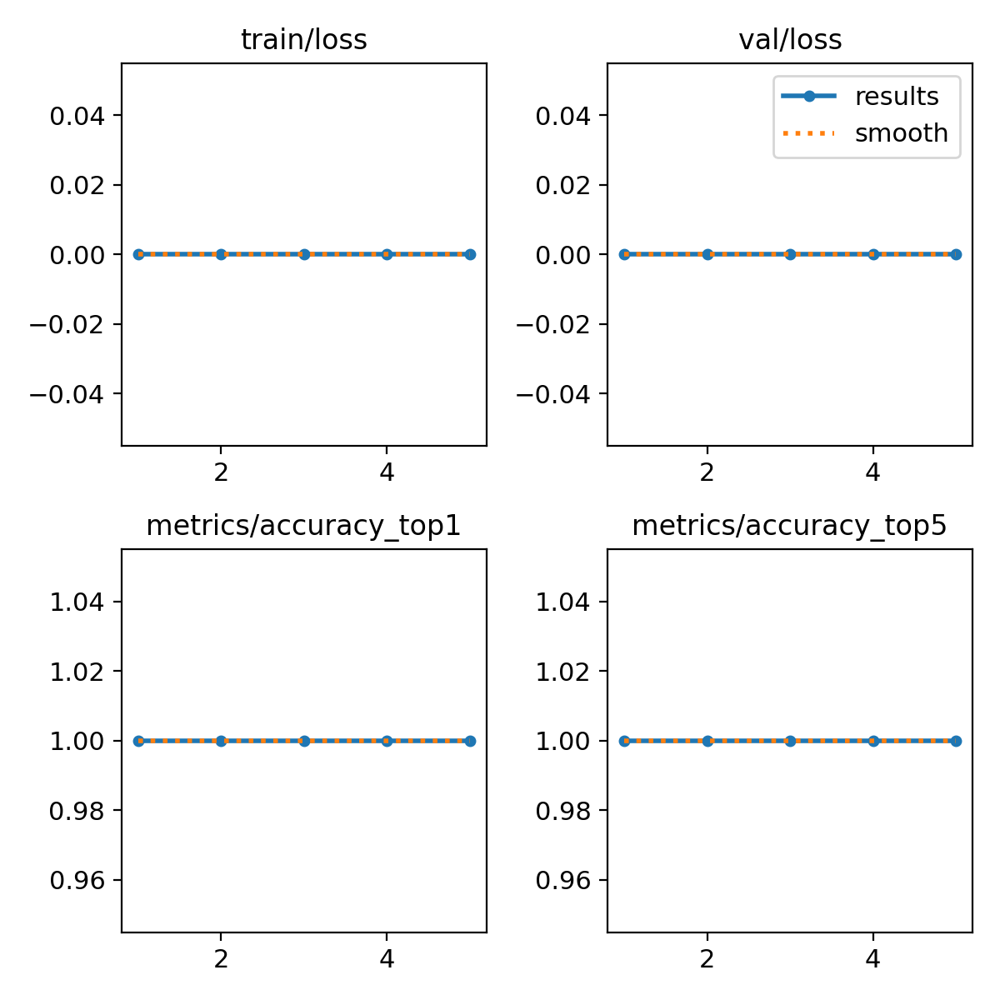

In [30]:
Image("/kaggle/working/runs/classify/train2/results.png", width=600)

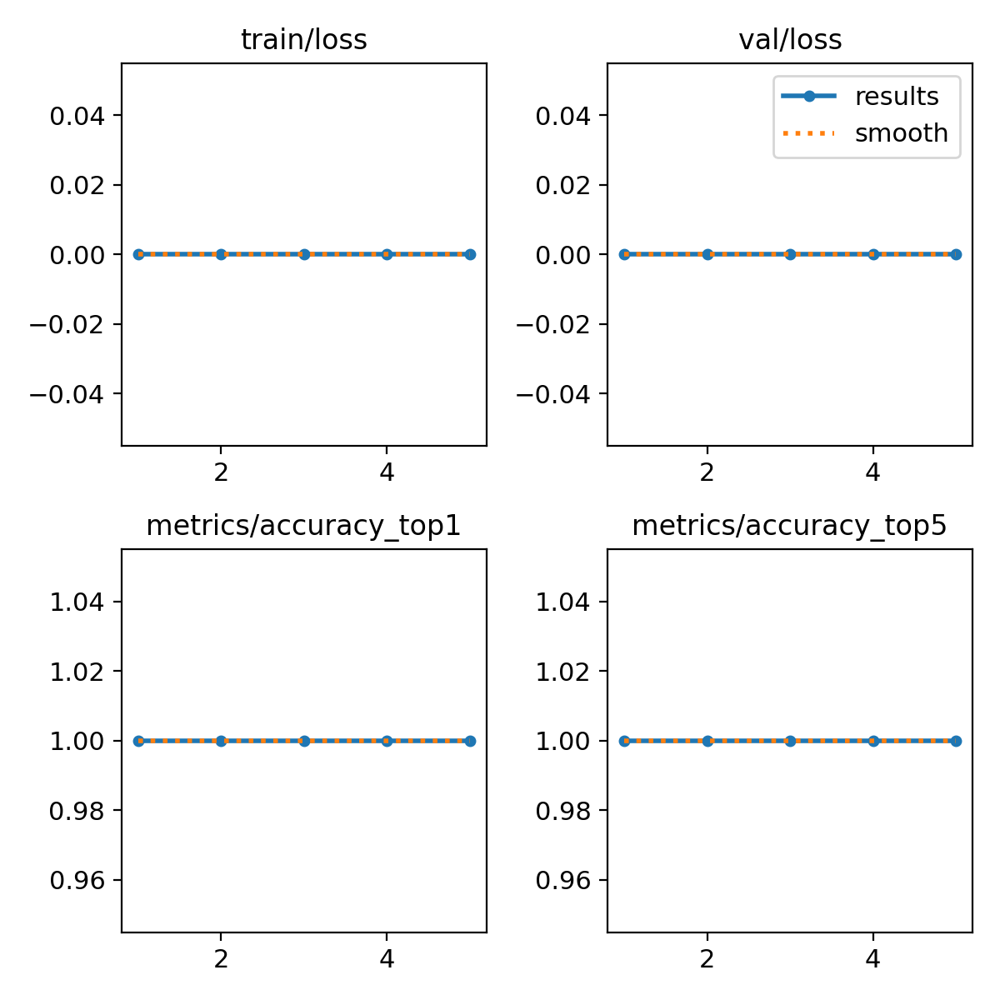

In [31]:
Image("/kaggle/working/runs/classify/train3/results.png", width=600)


image 1/1 /kaggle/working/runs/classify/train2/train_batch0.jpg: 640x640 fowlpox 1.00, 5.1ms
Speed: 52.7ms preprocess, 5.1ms inference, 0.1ms postprocess per image at shape (1, 3, 640, 640)


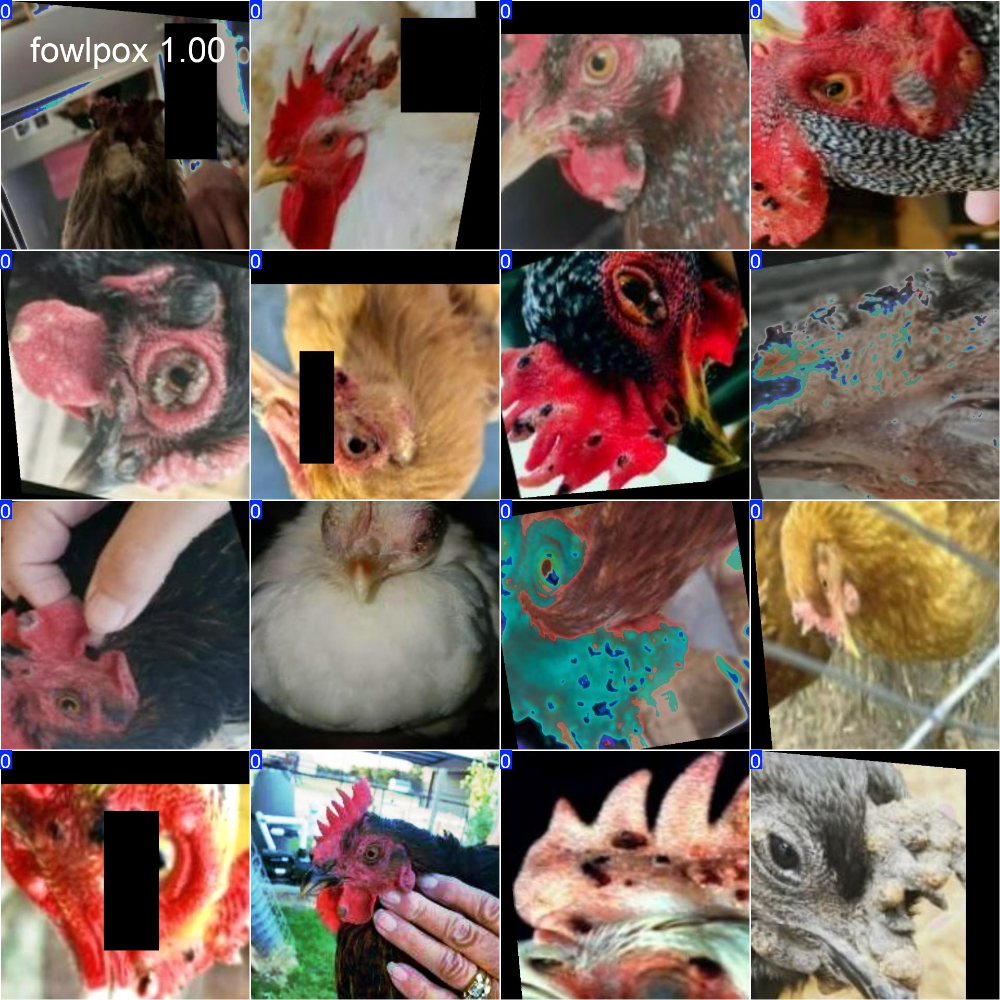

In [33]:

model = YOLO('/kaggle/working/runs/classify/train2/weights/best.pt')

results = model("/kaggle/working/runs/classify/train2/train_batch0.jpg") #, save=True, conf=0.5)
results[0].show()


image 1/1 /kaggle/working/runs/classify/train2/val_batch1_labels.jpg: 640x640 fowlpox 1.00, 4.8ms
Speed: 46.0ms preprocess, 4.8ms inference, 0.1ms postprocess per image at shape (1, 3, 640, 640)


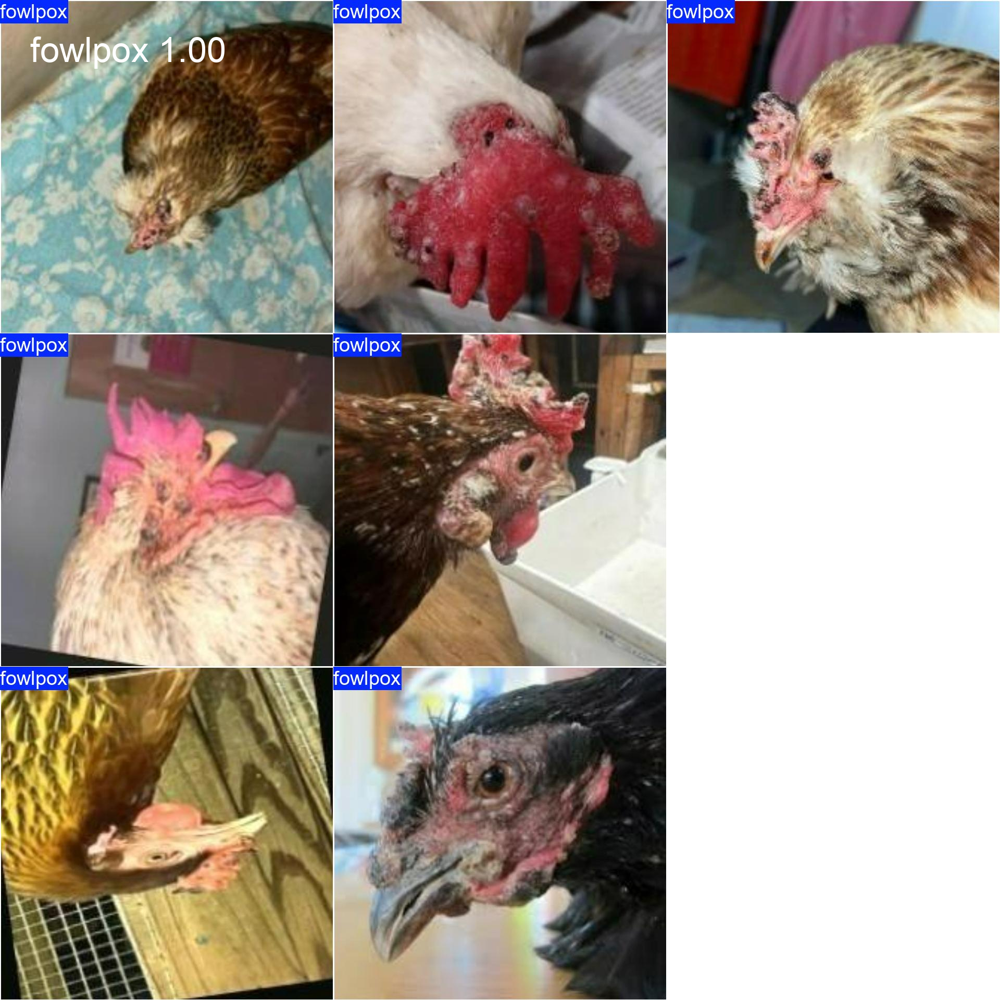

In [34]:
model = YOLO('/kaggle/working/runs/classify/train3/weights/best.pt')

results = model("/kaggle/working/runs/classify/train2/val_batch1_labels.jpg") #, save=True, conf=0.5)
results[0].show()


image 1/1 /kaggle/working/runs/classify/train3/val_batch0_labels.jpg: 640x640 fowlpox 1.00, 5.2ms
Speed: 38.4ms preprocess, 5.2ms inference, 0.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/classify/predict


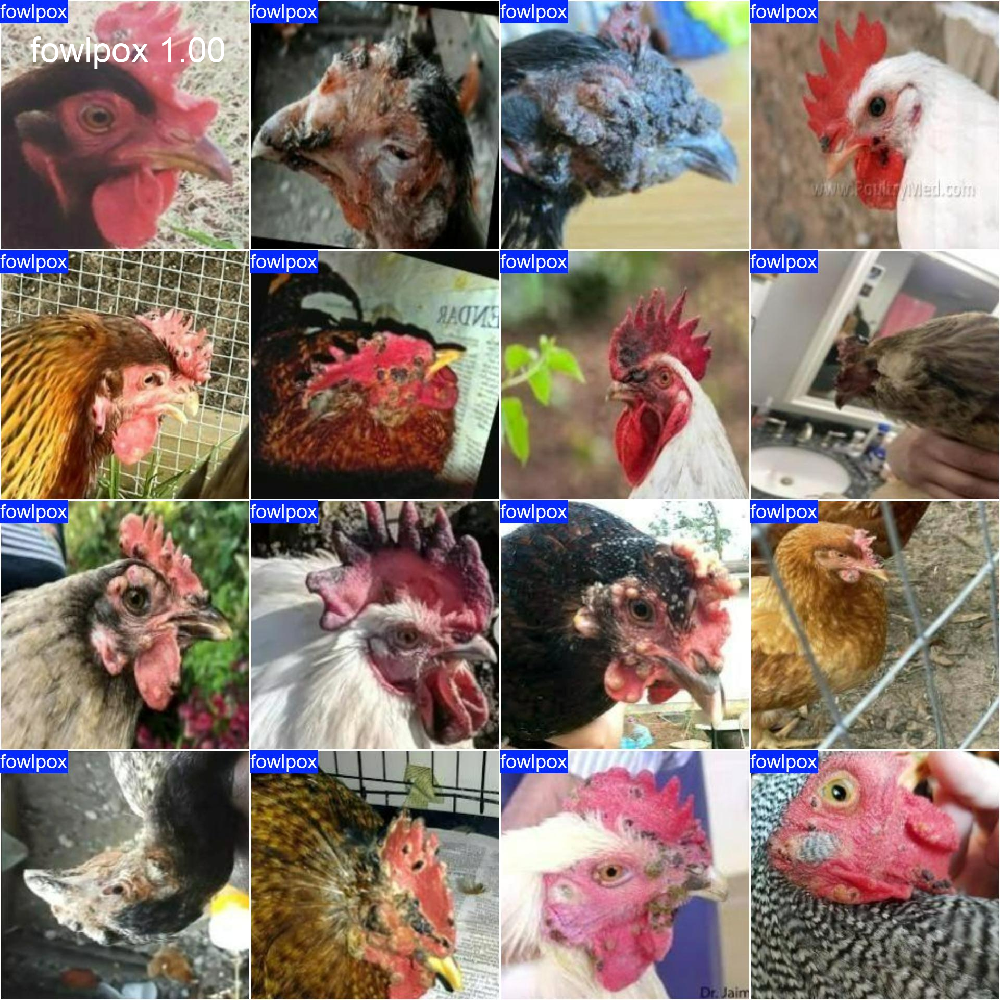

In [35]:
results = model("/kaggle/working/runs/classify/train3/val_batch0_labels.jpg", save=True, conf=0.5)
results[0].show()

In [36]:

results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'fowlpox'}
 obb: None
 orig_img: array([[[245,  35,  21],
         [239,  38,  19],
         [230,  42,  14],
         ...,
         [248, 255, 255],
         [250, 253, 255],
         [241, 244, 248]],
 
        [[248,  36,  19],
         [246,  38,  16],
         [241,  41,  12],
         ...,
         [241, 247, 252],
         [236, 240, 245],
         [250, 254, 255]],
 
        [[255,  38,  12],
         [255,  38,  10],
         [255,  39,   7],
         ...,
         [108, 112, 123],
         [122, 126, 137],
         [225, 229, 240]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [ 17,  17,  17],
         ...,
         [ 49,  56,  49],
         [ 85,  92,  85],
         [251, 255, 251]],
 
        [[255, 255, 255],
         [222, 222, 222],
         [ 47,  47,  47],
         ...,
         [ 84,  91,  84],
         [112, 119, 112],
